In [ ]:
!cp drive/MyDrive/Projects/Datasets_capstone.zip /content/
!unzip Datasets_capstone.zip -d /content/project_dataset
!rm -rf /content/project_dataset/Datasets_capstone.zip
!unzip "/content/project_dataset/Capstone 2/Part 1/dataset_hist_structures 2.zip" -d "/content/data"
!cp -a "/content/data/dataset_hist_structures 2/dataset_hist_structures/Dataset_test/Dataset_test_original_1478" "/content/data/test_img"
!cp -a "/content/data/dataset_hist_structures 2/dataset_hist_structures/Stuctures_Dataset" "/content/data/train_img"
!rm -rf "/content/data/dataset_hist_structures 2"
!cp -a "/content/project_dataset/Capstone 2/Part 2" "/content/data/recommendation"
!rm -rf /content/project_dataset
!rm -rf Datasets_capstone.zip
!rm -rf /content/data/test_img/.DS_Store
!rm -rf /content/data/train_img/.DS_Store
!find "/content/data/train_img" -name ".DS_Store" -delete
!find "/content/data/test_img" -name ".DS_Store" -delete
!find "/content/data/train_img" -name "*.bat" -delete
!find "/content/data/test_img" -name "*.bat" -delete

In [188]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import random
from PIL import ImageFile, Image
import tensorflow as tf
from scipy.stats import skew
ImageFile.LOAD_TRUNCATED_IMAGES = True

**Part 1**
---
XYZ Pvt. Ltd., a leading industry consulting firm, has been hired to help the cause by
developing an intelligent and automated AI model using TensorFlow that can predict the
category of a structure in an image.

Plot sample images (8–10) from each class or category to gain a betterunderstanding of each class

Train labels: ['altar', 'apse', 'bell_tower', 'column', 'dome(inner)', 'dome(outer)', 'flying_buttress', 'gargoyle', 'stained_glass', 'vault']
Total Train labels: 10
Test labels: ['altar', 'apse', 'bell_tower', 'column', 'dome(inner)', 'dome(outer)', 'flying_buttress', 'gargoyle', 'stained_glass', 'vault']
Total Test labels: 10


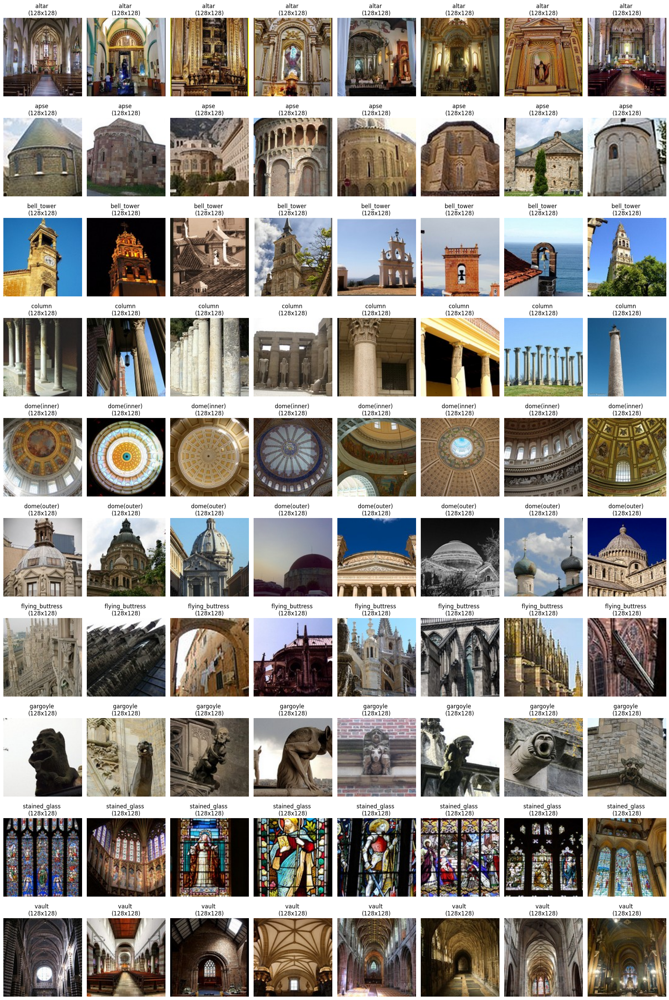

In [ ]:
train_path = 'data/train_img'
test_path = 'data/test_img'

train_labels = sorted(os.listdir(train_path))
test_labels = sorted(os.listdir(test_path))

print(f"Train labels: {train_labels}")
print(f"Total Train labels: {len(train_labels)}")
print(f"Test labels: {test_labels}")
print(f"Total Test labels: {len(test_labels)}")

plt.figure(figsize=(20,len(train_labels) * 3))

num_samples_per_label = 8

for i, label in enumerate(train_labels):
  label_dir  = os.path.join(train_path, label)
  if os.path.isdir(label_dir):
    image_files = [f for f in os.listdir(label_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    sample_images = random.sample(image_files, min(num_samples_per_label, len(image_files)))

    for j,img_name in enumerate(sample_images):
      img_path = os.path.join(label_dir, img_name)
      img = cv2.imread(img_path)
      if img is not None:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(len(train_labels), num_samples_per_label, i * num_samples_per_label + j + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"{label} \n({img.shape[1]}x{img.shape[0]})")
plt.tight_layout()
plt.show()

In [ ]:
#Checking for any corruputed file
#Remove corrputed files if found

def check_images(directory):
    corrupted_files = []
    for root, _, files in os.walk(directory):
        for file in files:
            filepath = os.path.join(root, file)
            try:
                Image.open(filepath).verify()
            except (IOError, SyntaxError) as e:
                print(f"  [CORRUPTED] {filepath}: {e}")
                corrupted_files.append(filepath)
            except Exception as e:
                print(f"  [ERROR] {filepath}: {e}")
                corrupted_files.append(filepath)
    print(f"Finished checking {directory}. Found {len(corrupted_files)} corrupted files.")
    return corrupted_files

corrupted_train = check_images(train_path)
corrupted_test = check_images(test_path)


if corrupted_train or corrupted_test:
  print("Corrupted Train Files ",corrupted_train)
  print("Corrupted Test Files ",corrupted_test)

for file in corrupted_train:
  os.remove(file)
print(f"Removed train corrupted files {len(corrupted_train)}")

for file in corrupted_test:
  os.remove(file)
print(f"Removed test corrupted files {len(corrupted_test)}")


Finished checking data/train_img. Found 0 corrupted files.
  [CORRUPTED] data/test_img/stained_glass/9d1de848-bfd8-40e1-9686-0f8aba896655.jpg: cannot identify image file 'data/test_img/stained_glass/9d1de848-bfd8-40e1-9686-0f8aba896655.jpg'
Finished checking data/test_img. Found 1 corrupted files.
Corrupted Train Files  []
Corrupted Test Files  ['data/test_img/stained_glass/9d1de848-bfd8-40e1-9686-0f8aba896655.jpg']
Removed train corrupted files 0
Removed test corrupted files 1


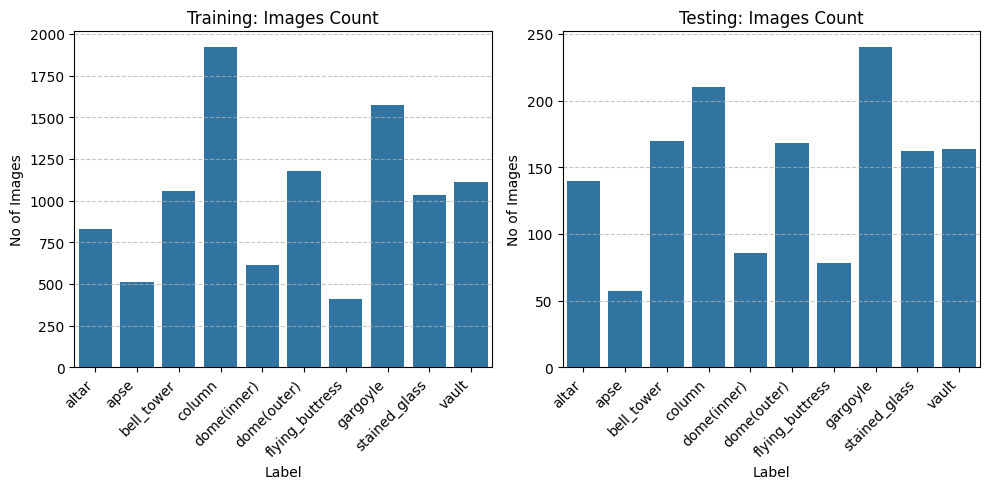

In [ ]:
#Function to get label and count
def get_labels_from_directory(directory):
    all_labels = []
    labels = sorted(os.listdir(directory))

    for label in labels:
      label_dir = os.path.join(directory, label)
      if os.path.isdir(label_dir):
        count = len(os.listdir(label_dir))
        all_labels.append((label, count))
    return all_labels

train_labels_count =  get_labels_from_directory(train_path)
test_labels_count = get_labels_from_directory(test_path)

train_plt_df = pd.DataFrame(train_labels_count, columns=['Label', 'Count'])
test_plt_df = pd.DataFrame(test_labels_count, columns=['Label', 'Count'])
all_labels = sorted(list(set(train_plt_df['Label'].tolist() + test_plt_df['Label'].tolist())))

train_df = train_plt_df.set_index('Label').reindex(all_labels).fillna(0).reset_index()
test_df = test_plt_df.set_index('Label').reindex(all_labels).fillna(0).reset_index()

#Plot
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
sns.barplot(x='Label', y='Count', data=train_df)
plt.title('Training: Images Count')
plt.xlabel('Label')
plt.ylabel('No of Images')
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.subplot(1, 2, 2)
sns.barplot(x='Label', y='Count', data=test_df)
plt.title('Testing: Images Count')
plt.xlabel('Label')
plt.ylabel('No of Images')
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()

In [ ]:
import tensorflow as tf
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix

#CPU Settings
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)


#Variable Declaration
TRAIN_DIR = 'data/train_img'
TEST_DIR = 'data/test_img'
IMG_WIDTH, IMG_HEIGHT = 128,128
BATCH_SIZE = 16
SEED = 42
EPOCH_NO_AUGMENTATION = 10
EPOCH_WITH_AUGMENTATION = 50
VALIDDATION_ACCURACY_THRESHOLD = 0.90

#labels and count
labels = sorted(os.listdir(TRAIN_DIR))
labels_count = len(labels)

#Loading Data with no augmentation
train_datagen_no_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255)
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255)

train_datagen_no_augmentation = train_datagen_no_augmentation.flow_from_directory(
    TRAIN_DIR,
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
)

validation_generator_no_augmentation = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

unique_train_labels = np.unique(train_datagen_no_augmentation.classes)
train_labels_numeric_for_weights = train_datagen_no_augmentation.classes

#Weights Settings
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=unique_train_labels,
    y=train_labels_numeric_for_weights
)
class_weight_dict = dict(enumerate(class_weights_array))

# We are using MobileNetV2 as the Base Model as i wanted a pretrained model
# Which is light and can run on client side and CPU aswell
# and is effiecient in image classification
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(IMG_WIDTH, IMG_HEIGHT, 3),
    include_top=False,
    weights='imagenet'
)
#free base model layers
for layer in base_model.layers:
  layer.trainable = False

#Create a Sequential Model Definition for our learning
model = tf.keras.Sequential()
model.add(base_model)
model.add(tf.keras.layers.GlobalAveragePooling2D())
model.add(tf.keras.layers.Dense(512, activation='relu'))
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(512, activation='relu'))
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(256, activation='relu'))
model.add(tf.keras.layers.Dropout(0.3))
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dropout(0.3))
model.add(tf.keras.layers.Dense(labels_count, activation='softmax'))

tf.keras.backend.clear_session()

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

#Custom Callback for early stopping if the target is met
class CustomEarlyStop(tf.keras.callbacks.Callback):
  def __init__(self,val='accuracy',val2='val_accuracy',SL=VALIDDATION_ACCURACY_THRESHOLD) -> None:
     super().__init__()
     self.val = val
     self.val2 = val2
     self.SL = SL

  def on_epoch_end(self, epoch, logs=None):
    val = logs.get(self.val)
    val2 = logs.get(self.val2)
    if val2 > val and val2 > self.SL:
      self.model.stop_training = True


#call for early stopping based on loss and controls overfitting
earlystop_callback = tf.keras.callbacks.EarlyStopping(monitor='loss',patience=6)

#Training model on data with no augementation
history_no_augmentation = model.fit(
    train_datagen_no_augmentation,
    epochs=EPOCH_NO_AUGMENTATION,
    validation_data=validation_generator_no_augmentation,
    class_weight=class_weight_dict,
    callbacks=[CustomEarlyStop(),earlystop_callback]
)

#Loading data with augmentation
train_datagen_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_datagen_augmentation = train_datagen_augmentation.flow_from_directory(
    TRAIN_DIR,
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    classes=labels,
)



model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

#2nd Training Model on Augmentation
history_aug = model.fit(
    train_datagen_augmentation,
    epochs=EPOCH_WITH_AUGMENTATION,
    validation_data=validation_generator_no_augmentation,
    callbacks=[CustomEarlyStop(),earlystop_callback],
    class_weight=class_weight_dict)


Found 10235 images belonging to 10 classes.
Found 1475 images belonging to 10 classes.
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128            │ (None, 4, 4, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,342,026 (12.75 MB)

 Trainable params: 1,084,042 (4.14 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


640/640 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - accuracy: 0.2425 - loss: 2.1707 - val_accuracy: 0.8244 - val_loss: 0.6247
Epoch 2/10
640/640 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.7473 - loss: 0.7779 - val_accuracy: 0.8969 - val_loss: 0.3288
Epoch 3/10
640/640 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.8643 - loss: 0.4540 - val_accuracy: 0.9125 - val_loss: 0.2903
Found 10235 images belonging to 10 classes.
Epoch 1/50
640/640 ━━━━━━━━━━━━━━━━━━━━ 60s 79ms/step - accuracy: 0.7808 - loss: 0.7743 - val_accuracy: 0.8902 - val_loss: 0.3680
Epoch 2/50
640/640 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - accuracy: 0.8044 - loss: 0.6487 - val_accuracy: 0.8834 - val_loss: 0.3729
Epoch 3/50
640/640 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - accuracy: 0.8180 - loss: 0.6203 - val_accuracy: 0.8814 - val_loss: 0.3861
Epoch 4/50
640/640 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - accuracy: 0.8217 - loss: 0.5905 - val_accuracy: 0.8895 - val_loss: 0.3712
Epoch 5/50
640/640 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step - acc


--- Evaluating Model on Test Set ---
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.9026 - loss: 0.3209
Test Loss: 0.3336
Test Accuracy: 0.9003

--- Generating Classification Report and Confusion Matrix ---
93/93 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step

Classification Report:
                 precision    recall  f1-score   support

          altar       0.90      0.98      0.94       140
           apse       0.93      0.70      0.80        57
     bell_tower       0.74      0.93      0.82       170
         column       0.97      0.80      0.88       210
    dome(inner)       0.94      0.87      0.90        86
    dome(outer)       0.89      0.98      0.93       168
flying_buttress       0.80      0.85      0.82        78
       gargoyle       0.98      0.86      0.92       240
  stained_glass       0.98      0.98      0.98       162
          vault       0.90      0.93      0.92       164

       accuracy                           0.90      1475
      macro avg       0.90      0.8

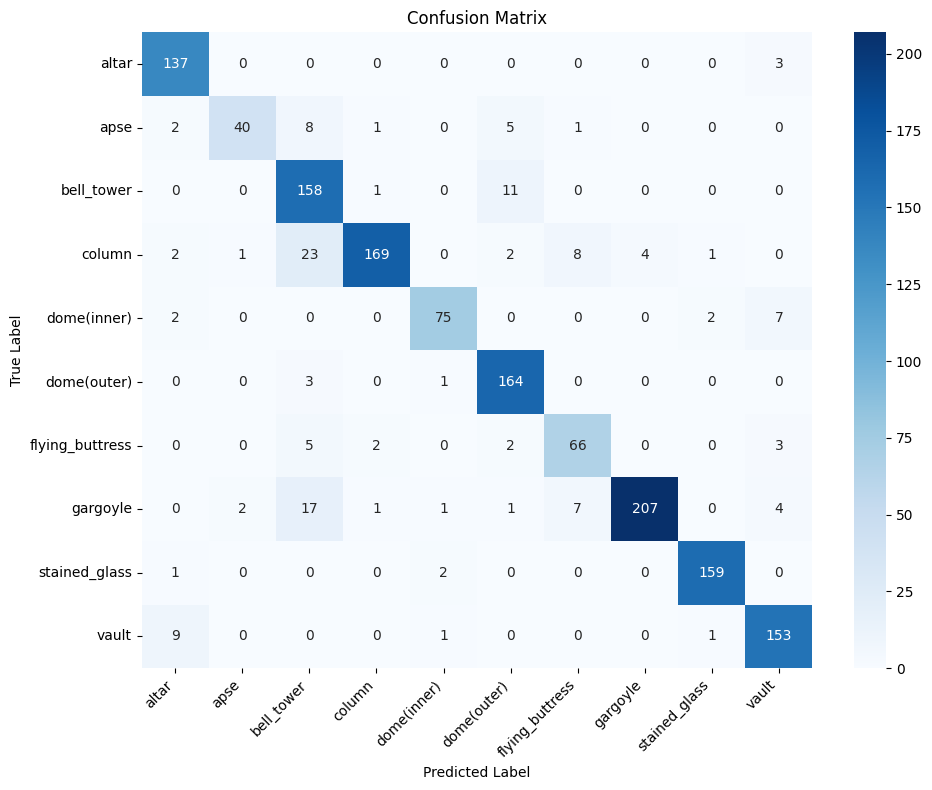


--- Visualizing Training History ---


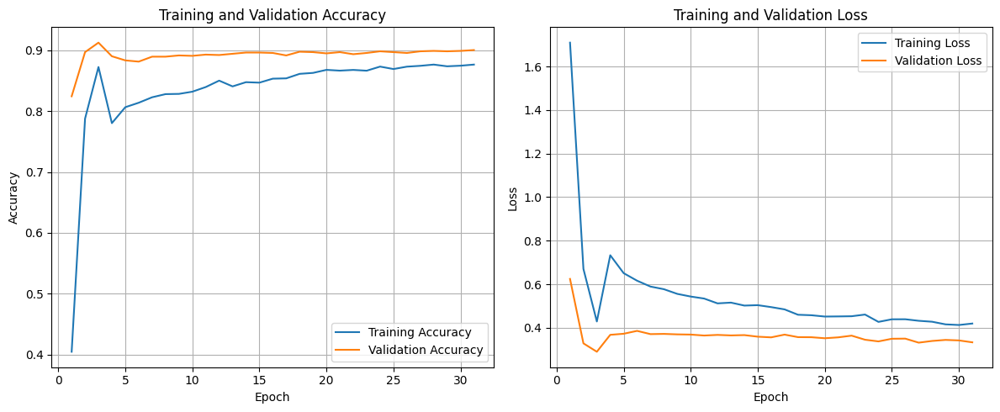


--- Model Training and Testing Complete ---


In [ ]:


print("\n--- Evaluating Model on Test Set ---")
loss, accuracy = model.evaluate(validation_generator_no_augmentation)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")


print("\n--- Generating Classification Report and Confusion Matrix ---")
true_labels = validation_generator_no_augmentation.classes

predictions_probabilities = model.predict(validation_generator_no_augmentation)
predicted_labels = np.argmax(predictions_probabilities, axis=1)


if len(true_labels) != len(predicted_labels):
    print("Warning: Mismatch between number of true labels and predictions. This can happen with incomplete last batch.")
    min_len = min(len(true_labels), len(predicted_labels))
    true_labels = true_labels[:min_len]
    predicted_labels = predicted_labels[:min_len]


print("\nClassification Report:")
print(classification_report(true_labels, predicted_labels, target_names=labels))

print("\nConfusion Matrix:")
cm = confusion_matrix(true_labels, predicted_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# --- Visualize Training History ---
print("\n--- Visualizing Training History ---")
acc = history_no_augmentation.history['accuracy'] + history_aug.history['accuracy']
val_acc = history_no_augmentation.history['val_accuracy'] + history_aug.history['val_accuracy']
loss = history_no_augmentation.history['loss'] + history_aug.history['loss']
val_loss = history_no_augmentation.history['val_loss'] + history_aug.history['val_loss']

epochs_combined = range(1, len(acc) + 1)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_combined, acc, label='Training Accuracy')
plt.plot(epochs_combined, val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(epochs_combined, loss, label='Training Loss')
plt.plot(epochs_combined, val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

print("\n--- Model Training and Testing Complete ---")

In [ ]:
#saving model
model.save('drive/MyDrive/Models/capstone.keras')

In [ ]:
#Loading the model
model = tf.keras.models.load_model('drive/MyDrive/Models/capstone.keras')
TRAIN_DIR = 'data/train_img'
TEST_DIR = 'data/test_img'
IMG_WIDTH, IMG_HEIGHT = 128,128
labels = sorted(os.listdir(TRAIN_DIR))

In [ ]:
#Function to preprocess images for model predictions
def process_image(image_path):
  img = tf.keras.preprocessing.image.load_img(image_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
  img_array = tf.keras.preprocessing.image.img_to_array(img)
  img_array = np.expand_dims(img_array,axis=0)
  img_array /= 255
  return img_array

def predict_image(image_path,actual_label):
  processed_image = process_image(image_path)
  predictions = model.predict(processed_image)
  predicted_class_index = np.argmax(predictions[0])
  predicted_class_name = labels[predicted_class_index]
  confidence = predictions[0][predicted_class_index] * 100
  plt.figure(figsize=(3, 3))
  plt.imshow(processed_image[0])
  plt.axis('off')
  title = f"Predicted: {predicted_class_name} ({confidence:.2f}%) \nActual Label: ({actual_label})"
  plt.title(title)
  plt.show()

**Test Model Predections**

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


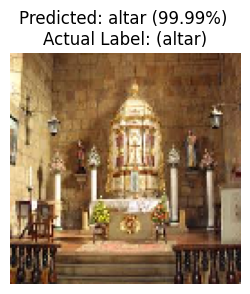

In [ ]:
test_image = '/content/data/test_img/altar/00947185-77b4-4ecf-85ed-bf139c7d5a1d.jpg'
predict_image(test_image,'altar')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


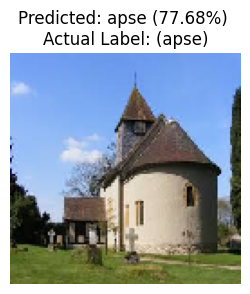

In [ ]:
test_image = '/content/data/test_img/apse/apse (11).jpg'
predict_image(test_image,'apse')

In [ ]:
import requests
from PIL import Image
from io import BytesIO

#Function to test prediction from Internet
def download_image_from_url(url,name):

    try:
        response = requests.get(url, stream=True)
        response.raise_for_status()
        image_bytes = BytesIO(response.content)
        img = Image.open(image_bytes)
        if img.mode != 'RGB':
            img = img.convert('RGB')
        img.resize((IMG_WIDTH, IMG_HEIGHT))
        img.save(name)
    except Exception as e:
        print(f"Error: {e}")
        return None


**Test Model on Internet found Image**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


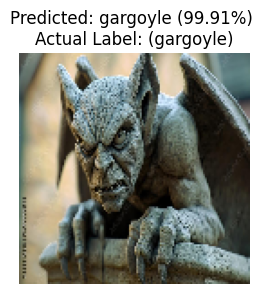

In [ ]:
image_url = "https://as1.ftcdn.net/v2/jpg/12/90/98/80/1000_F_1290988044_EQc4YUb1dPljLGPaeB4Ntn36woVsiU2T.jpg"
filename = 'gargoyle.jpg'
download_image_from_url(image_url,filename)
test_image = f'/content/{filename}'
predict_image(test_image,'gargoyle')

**Project Part 2** - The second objective of this project requires you to perform exploratory data analysis and develop a recommendation engine that will help tourists visit their places of interest.





In [189]:
rating_df = pd.read_csv('data/recommendation/tourism_rating.csv')
tourism_df = pd.read_excel('data/recommendation/tourism_with_id.xlsx')
user_df = pd.read_csv('data/recommendation/user.csv')

In [190]:
print(rating_df.info())
rating_df.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   User_Id        10000 non-null  int64
 1   Place_Id       10000 non-null  int64
 2   Place_Ratings  10000 non-null  int64
dtypes: int64(3)
memory usage: 234.5 KB
None


,User_Id,Place_Id,Place_Ratings
0,1,179,3
1,1,344,2
2,1,5,5
3,1,373,3
4,1,101,4


In [191]:
print(tourism_df.info())
tourism_df.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 437 entries, 0 to 436
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Place_Id      437 non-null    int64  
 1   Place_Name    437 non-null    object 
 2   Description   437 non-null    object 
 3   Category      437 non-null    object 
 4   City          437 non-null    object 
 5   Price         437 non-null    int64  
 6   Rating        437 non-null    float64
 7   Time_Minutes  205 non-null    float64
 8   Coordinate    437 non-null    object 
 9   Lat           437 non-null    float64
 10  Long          437 non-null    float64
 11  Unnamed: 11   0 non-null      float64
 12  Unnamed: 12   437 non-null    int64  
dtypes: float64(5), int64(3), object(5)
memory usage: 44.5+ KB
None


,Place_Id,Place_Name,Description,Category,City,Price,Rating,Time_Minutes,Coordinate,Lat,Long,Unnamed: 11,Unnamed: 12
0,1,Monumen Nasional,Monumen Nasional atau yang populer disingkat d...,Budaya,Jakarta,20000,4.6,15.0,"{'lat': -6.1753924, 'lng': 106.8271528}",-6.175392,106.827153,NaN,1
1,2,Kota Tua,"Kota tua di Jakarta, yang juga bernama Kota Tu...",Budaya,Jakarta,0,4.6,90.0,"{'lat': -6.137644799999999, 'lng': 106.8171245}",-6.137645,106.817125,NaN,2
2,3,Dunia Fantasi,Dunia Fantasi atau disebut juga Dufan adalah t...,Taman Hiburan,Jakarta,270000,4.6,360.0,"{'lat': -6.125312399999999, 'lng': 106.8335377}",-6.125312,106.833538,NaN,3
3,4,Taman Mini Indonesia Indah (TMII),Taman Mini Indonesia Indah merupakan suatu kaw...,Taman Hiburan,Jakarta,10000,4.5,NaN,"{'lat': -6.302445899999999, 'lng': 106.8951559}",-6.302446,106.895156,NaN,4
4,5,Atlantis Water Adventure,Atlantis Water Adventure atau dikenal dengan A...,Taman Hiburan,Jakarta,94000,4.5,60.0,"{'lat': -6.12419, 'lng': 106.839134}",-6.124190,106.839134,NaN,5


In [192]:
print(user_df.info())
user_df.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   User_Id   300 non-null    int64 
 1   Location  300 non-null    object
 2   Age       300 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 7.2+ KB
None


,User_Id,Location,Age
0,1,"Semarang, Jawa Tengah",20
1,2,"Bekasi, Jawa Barat",21
2,3,"Cirebon, Jawa Barat",23
3,4,"Bekasi, Jawa Barat",21
4,5,"Lampung, Sumatera Selatan",20


**1. Import all the datasets and perform preliminary inspections, such as:**
1.   Check for missing values and duplicates
2.   Remove any anomalies found in the data

In [193]:
print(f"No. of places rated count: {rating_df['Place_Id'].nunique()}")
print(f"No. of User rated count: {rating_df['User_Id'].nunique()}")
print(f"Rating skewness {rating_df['Place_Ratings'].skew()}")
print(f"Rating CV {np.std(rating_df['Place_Ratings']) / np.mean(rating_df['Place_Ratings'])}")
print(f"Rating data is nearly symmetric and have moderate variations")
print(f"Missing values 0")
rating_df['Place_Ratings'].describe().to_frame().T

No. of places rated count: 437
No. of User rated count: 300
Rating skewness -0.04745225588085983
Rating CV 0.44998638115571443
Rating data is nearly symmetric and have moderate variations
Missing values 0


,count,mean,std,min,25%,50%,75%,max
Place_Ratings,10000.0,3.0665,1.379952,1.0,2.0,3.0,4.0,5.0


In [194]:
print(f"No. of Location from Where Users are: {user_df['Location'].nunique()}")
print(f"No. of Users: {user_df['User_Id'].nunique()}")
print(f"Age skewness {user_df['Age'].skew()}")
print(f"Age CV {np.std(user_df['Age']) / np.mean(user_df['Age'])}")
print(f"Age data is symmetric and have negliable variations")
user_df['Age'].describe().to_frame().T

No. of Location from Where Users are: 28
No. of Users: 300
Age skewness 0.008177316085058168
Age CV 0.22240593980522605
Age data is symmetric and have negliable variations


,count,mean,std,min,25%,50%,75%,max
Age,300.0,28.7,6.393716,18.0,24.0,29.0,34.0,40.0


In [195]:
print(f"No. Unique Places : {tourism_df['Place_Name'].nunique()}")
print(f"No. of Category: {tourism_df['Category'].nunique()}")
print(f"No. of City: {tourism_df['City'].nunique()}")
print(f"Price skewness {tourism_df['Price'].skew()}")
print(f"Time_Minutes skewness {tourism_df['Time_Minutes'].skew()}")
print(f"Rating skewness {tourism_df['Rating'].skew()}")
print(f"Time_Minutes Missing Values {round((tourism_df['Time_Minutes'].isnull().mean() * 100),2)}")

print(f"Price is highly skewed and not normally distributed.")
print(f"Time is highly skewed and not normally distributed. Have 53% missing values")
print(f"Rating is moderately skewed ")
print(f"Column Unnamed: 11 can be dropped as it is empty have no data.")
print(f"Column Unnamed: 12 is duplicate of column Place_Id. So it can be dropped")
tourism_df.drop(columns=['Unnamed: 11','Unnamed: 12'],inplace=True)
tourism_df.drop(columns=['Place_Id']).describe().T

No. Unique Places : 437
No. of Category: 6
No. of City: 5
Price skewness 7.369218246392351
Time_Minutes skewness 1.604701412911251
Rating skewness -0.6282436018733608
Time_Minutes Missing Values 53.09
Price is highly skewed and not normally distributed.
Time is highly skewed and not normally distributed. Have 53% missing values
Rating is moderately skewed 
Column Unnamed: 11 can be dropped as it is empty have no data.
Column Unnamed: 12 is duplicate of column Place_Id. So it can be dropped


,count,mean,std,min,25%,50%,75%,max
Price,437.0,24652.173913,66446.374709,0.000000,0.000000,5000.000000,20000.000000,900000.000000
Rating,437.0,4.442792,0.208587,3.400000,4.300000,4.500000,4.600000,5.000000
Time_Minutes,205.0,82.609756,52.872339,10.000000,45.000000,60.000000,120.000000,360.000000
Lat,437.0,-7.095438,0.727241,-8.197894,-7.749590,-7.020524,-6.829411,1.078880
Long,437.0,109.160142,1.962848,103.931398,107.578369,110.237468,110.431869,112.821662


In [196]:
print(f"Removing duplicates")
rating_df.drop_duplicates(inplace=True)
tourism_df.drop_duplicates(inplace=True)
user_df.drop_duplicates(inplace=True)

Removing duplicates


**Check Tourism Data and Anomalies**

/tmp/ipython-input-197-818585545.py:55: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


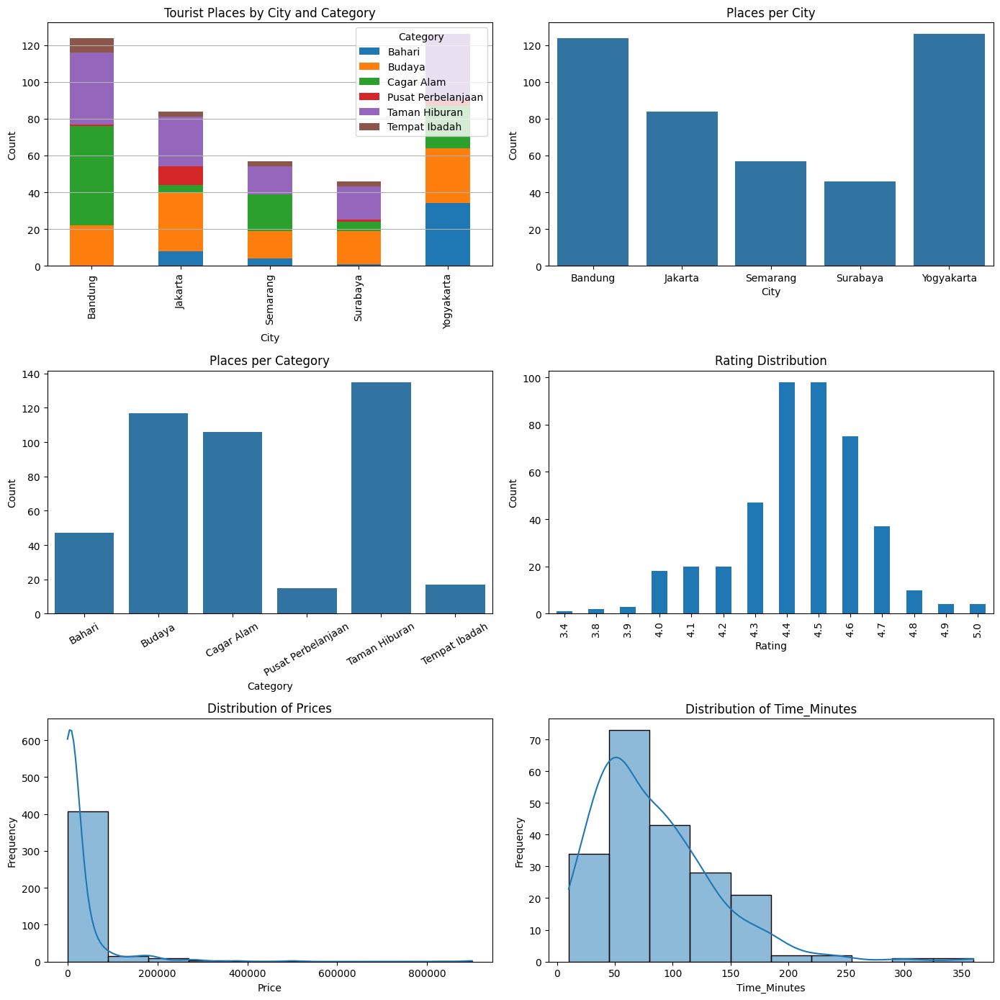


--- Metrics Summary ---
City     -> CV: 0.38, Skew: 0.04
Category -> CV: 0.66, Skew: -0.03
Rating   -> CV: 1.08, Skew: 1.02


In [197]:
city_category_count = pd.pivot_table(
    tourism_df,
    index='City',
    columns='Category',
    values='Place_Id',
    aggfunc='count',
    margins=True,
    fill_value=0,
    margins_name='Total'
)

filtered  = city_category_count.drop(index='Total').drop(columns='Total')

fig, axes = plt.subplots(3, 2, figsize=(14, 14),constrained_layout=True)

filtered.plot(kind='bar', stacked=True, ax=axes[0, 0])
plt.title('Number of Tourist Places by City and Category')
axes[0, 0].set_title('Tourist Places by City and Category')
axes[0, 0].set_xlabel('City')
axes[0, 0].set_ylabel('Count')
axes[0, 0].legend(title='Category', loc='upper right')
axes[0, 0].grid(axis='y')

places_in_city = tourism_df['City'].value_counts().sort_index()
sns.barplot(x=places_in_city.index, y=places_in_city.values, ax=axes[0, 1])
axes[0, 1].set_title("Places per City")
axes[0, 1].set_ylabel("Count")



places_in_category = tourism_df['Category'].value_counts().sort_index()
sns.barplot(x=places_in_category.index, y=places_in_category.values, ax=axes[1, 0])
axes[1, 0].set_title("Places per Category")
axes[1, 0].set_ylabel("Count")
axes[1, 0].tick_params(axis='x', rotation=30)


place_agg_rating = tourism_df['Rating'].value_counts().sort_index()
place_agg_rating.plot(kind='bar', ax=axes[1, 1])
axes[1, 1].set_title("Rating Distribution")
axes[1, 1].set_xlabel("Rating")
axes[1, 1].set_ylabel("Count")

sns.histplot(tourism_df['Price'], bins=10, kde=True, ax=axes[2, 0])
axes[2, 0].set_title('Distribution of Prices')
axes[2, 0].set_xlabel('Price')
axes[2, 0].set_ylabel('Frequency')

sns.histplot(tourism_df['Time_Minutes'].dropna(), bins=10, kde=True, ax=axes[2, 1])
axes[2, 1].set_title('Distribution of Time_Minutes')
axes[2, 1].set_xlabel('Time_Minutes')
axes[2, 1].set_ylabel('Frequency')


plt.tight_layout()
plt.show()

city_cv = np.std(places_in_city) / np.mean(places_in_city)
city_skew = skew(places_in_city)

cat_cv = np.std(places_in_category) / np.mean(places_in_category)
cat_skew = skew(places_in_category)

rating_cv = np.std(place_agg_rating) / np.mean(place_agg_rating)
rating_skew = skew(place_agg_rating)


print("\n--- Metrics Summary ---")
print(f"City     -> CV: {city_cv:.2f}, Skew: {city_skew:.2f}")
print(f"Category -> CV: {cat_cv:.2f}, Skew: {cat_skew:.2f}")
print(f"Rating   -> CV: {rating_cv:.2f}, Skew: {rating_skew:.2f}")

**We will use model Imuation for missing values of Time_Minutes**


---

We observed above that Time_Minutes has 53% missing values. Which is a large value and using model impuation to more accurately impute missing data.

In [198]:
#Price values are highly skewed. So to reduce skewness we will log transform Price column
tourism_df['Price_Log'] = np.log1p(tourism_df['Price'])

#We See Rating distribution is highly concentrated in 4.4,4.5,4.6 rating.
# We will create labels and equally divide them to make data more normally distributed
bins = tourism_df['Rating'].quantile([0, 0.25, 0.5, 0.75, 1.0]).values
labels = ['Low', 'Medium', 'High', 'Very High']
tourism_df['Rating_Label'] = pd.cut(tourism_df['Rating'], bins=bins, labels=labels, include_lowest=True)

#Confirming Rating Label Skewness
label_encoding = {'Low': 0, 'Medium': 1, 'High': 2, 'Very High': 3}
encoded_labels = tourism_df['Rating_Label'].map(label_encoding)
rating_label_skew = skew(encoded_labels.dropna())

print(f"Rating now less skewed {round(rating_label_skew,2)}")
print(f"Price is now moderate skewed {round(skew(tourism_df['Price_Log']),2)}")


Rating now less skewed 0.54
Price is now moderate skewed -0.63


**OHE the Category,City,Rating_Label and creating Imputation DF**

In [199]:
tourism_time_imputation_df = tourism_df.copy()
tourism_time_imputation_df = pd.get_dummies(tourism_time_imputation_df, columns=['Category','City','Rating_Label'])
tourism_time_imputation_df.head(2)

,Place_Id,Place_Name,Description,Price,Rating,Time_Minutes,Coordinate,Lat,Long,Price_Log,...,Category_Tempat Ibadah,City_Bandung,City_Jakarta,City_Semarang,City_Surabaya,City_Yogyakarta,Rating_Label_Low,Rating_Label_Medium,Rating_Label_High,Rating_Label_Very High
0,1,Monumen Nasional,Monumen Nasional atau yang populer disingkat d...,20000,4.6,15.0,"{'lat': -6.1753924, 'lng': 106.8271528}",-6.175392,106.827153,9.903538,...,False,False,True,False,False,False,False,False,True,False
1,2,Kota Tua,"Kota tua di Jakarta, yang juga bernama Kota Tu...",0,4.6,90.0,"{'lat': -6.137644799999999, 'lng': 106.8171245}",-6.137645,106.817125,0.000000,...,False,False,True,False,False,False,False,False,True,False


In [200]:
#Removing outliers from imputation df
# we will also create df for training and df for predicting missing value
df_time_not_missing = tourism_time_imputation_df.dropna(subset=['Time_Minutes']).copy()
df_time_missing = tourism_time_imputation_df[tourism_df["Time_Minutes"].isnull()].copy()

def tuckey_outlier(df,column):
  data = df[column]
  Q1= data.quantile(0.25)
  Q3= data.quantile(0.75)

  IQR = Q3 - Q1
  lower_bound = Q1 - (IQR * 1.5)
  upper_bound = Q3 + (IQR * 1.5)
  outliers = data[(data < lower_bound) | (data > upper_bound)]
  return {'column':column,'outliers_index':outliers.index,'total_outliers':len(outliers)}


numeric_columns = df_time_not_missing.drop(columns=['Place_Id','Price']).select_dtypes(include=[np.number]).columns.to_list()
outliers_found = []
for column in numeric_columns:
  outliers_result = tuckey_outlier(df_time_not_missing,column)
  outliers_found.append(outliers_result)
  df_time_not_missing.drop(outliers_result['outliers_index'],inplace=True)

pd.DataFrame(outliers_found,columns=['column','outliers_index','total_outliers']).T

,0,1,2,3,4
column,Rating,Time_Minutes,Lat,Long,Price_Log
outliers_index,"Index([251], dtype='int64')","Index([2, 18, 69, 213], dtype='int64')","Index([], dtype='int64')","Index([], dtype='int64')","Index([], dtype='int64')"
total_outliers,1,4,0,0,0


In [201]:
#Model Training
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score
from sklearn.model_selection import KFold



features = ['Time_Minutes', 'Lat', 'Long', 'Price_Log',
            'Category_Bahari', 'Category_Budaya', 'Category_Cagar Alam',
            'Category_Pusat Perbelanjaan', 'Category_Taman Hiburan',
            'Category_Tempat Ibadah', 'City_Bandung', 'City_Jakarta',
            'City_Semarang', 'City_Surabaya', 'City_Yogyakarta', 'Rating_Label_Low',
            'Rating_Label_Medium', 'Rating_Label_High', 'Rating_Label_Very High']
target = 'Time_Minutes'
X = df_time_not_missing[features]
y = df_time_not_missing[target]


best_score = 0
best_state = 0
best_model = ''
SL = 0.9
for state in range(0,100):
  if best_score >= SL:
      break
  X_train, X_test, y_train, y_test = train_test_split(X , y, random_state=state)

  model_list = {
  'LinearRegression': LinearRegression(),
  'LightGBM': LGBMRegressor(n_estimators=100, random_state=state,verbose=-1),
  }

  for model_name, model in model_list.items():

    if best_score >= SL:
      break
    kf = KFold(n_splits=5, shuffle=True, random_state=state)


    train_scores = []
    test_scores = []

    for train_idx, val_idx in kf.split(X_train):
      X_fold_train, X_fold_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
      y_fold_train, y_fold_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

      model.fit(X_train,y_train)

      train_score = model.score(X_fold_train,y_fold_train)
      test_score = model.score(X_fold_val,y_fold_val)

      train_scores.append(train_score)
      test_scores.append(test_score)

    if np.mean(test_scores) > np.mean(train_score) and np.mean(test_scores) >= SL:
      if np.mean(test_scores) > best_score:
        best_score = np.mean(test_scores)
        best_state = state
        best_model = model
      print(f"Train Score: {np.mean(train_score)}")
      print(f"Test Score: {np.mean(test_scores)}")
      print(f"Best Score: {best_score}")
      print(f"State: {best_state}")
      print(f"Model Name: {model_name}")
      print("="*20,"\n")



Train Score: 0.9339181135986834
Test Score: 0.9418479271059397
Best Score: 0.9418479271059397
State: 0
Model Name: LightGBM



In [202]:
print(f"Our best model for Imputation is {model_name}")
X_missing = df_time_missing[features]
df_time_missing['Time_Minutes'] = best_model.predict(X_missing)
tourism_df.loc[df_time_missing.index, 'Time_Minutes'] = df_time_missing['Time_Minutes']


#The data of Time_Minutes is skewed and we will use clipping so the outliers are removed and log transform for reducing the skewness
Q1 = tourism_df["Time_Minutes"].quantile(0.25)
Q3 = tourism_df["Time_Minutes"].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

lower_bound,upper_bound
tourism_df["Time_Minutes_Clipped"] = tourism_df["Time_Minutes"].clip(lower=lower_bound, upper=upper_bound)
tourism_df["Time_Minutes_log"] =  np.log1p(tourism_df["Time_Minutes_Clipped"])
print(f"Skewness of Time Minutes as applying log {round(tourism_df['Time_Minutes_log'].skew(),2)}. The Time Minutes after log is close to symmetrical")

Our best model for Imputation is LightGBM
Skewness of Time Minutes as applying log 0.64. The Time Minutes after log is close to symmetrical


In [203]:
print(f"Time Minutes Total Null values:  {(tourism_df['Time_Minutes_log'].isnull().mean() * 100)}")

Time Minutes Total Null values:  0.0


**2. To understand the tourism highlights better, you must explore the data in depth.**
1.   Explore the user group that provides the tourism ratings by:
    *   Analyzing the age distribution of users visiting the places and rating them
    *   Identifying the places where most of these users (tourists) are coming from

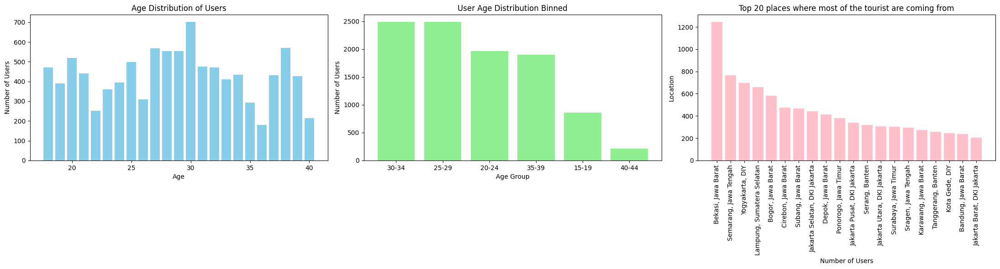

In [204]:
user_ratings = rating_df.merge(user_df,on='User_Id',how='inner')
place_ratings = rating_df.merge(tourism_df,on='Place_Id',how='inner')
age_counts = user_ratings['Age'].value_counts().sort_index()
location_counts = user_ratings['Location'].value_counts().head(20)

age_bins = [15, 20, 25, 30, 35,40,45]
age_labels = ['15-19', '20-24', '25-29', '30-34','35-39','40-44']
user_ratings['Age_Group'] = pd.cut(user_ratings['Age'], bins=age_bins, labels=age_labels, right=False)
user_group_distribution = user_ratings['Age_Group'].value_counts().sort_values(ascending=False)


fig,axs = plt.subplots(nrows=1,ncols=3,figsize=(22,6))
axs = axs.flatten()

axs[0].bar(age_counts.index,age_counts.values,color='skyblue')
axs[0].set_title('Age Distribution of Users')
axs[0].set_xlabel('Age')
axs[0].set_ylabel('Number of Users')

axs[1].bar(user_group_distribution.index,user_group_distribution.values,color='lightgreen')
axs[1].set_title('User Age Distribution Binned')
axs[1].set_xlabel('Age Group')
axs[1].set_ylabel('Number of Users')

axs[2].bar(location_counts.index,location_counts.values,color='pink')
axs[2].set_title('Top 20 places where most of the tourist are coming from')
axs[2].set_xlabel('Number of Users')
axs[2].set_ylabel('Location')
axs[2].tick_params(axis='x',rotation=90)

plt.tight_layout()
plt.show()

**3. Next, let's explore the locations and categories of tourist spots.**
1.   What are the different categories of tourist spots?
2.   What kind of tourism each location is most famous or suitable for?
3.   Which city would be the best for a nature enthusiast to visit?

**Category**
1.   "Culture",            # Budaya
2.   "Amusement Park",     # Taman Hiburan
3.   "Nature Reserve",     # Cagar Alam
4.   "Marine / Beach",     # Bahari
5.   "Shopping Center",    # Pusat Perbelanjaan
6.   "Place of Worship"    # Tempat Ibadah


/tmp/ipython-input-205-1052073834.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_categories_by_city = city_category.groupby('City',group_keys=False).apply(lambda x:x.loc[x['Count'].idxmax()]).reset_index(drop=True).sort_values(by='City')


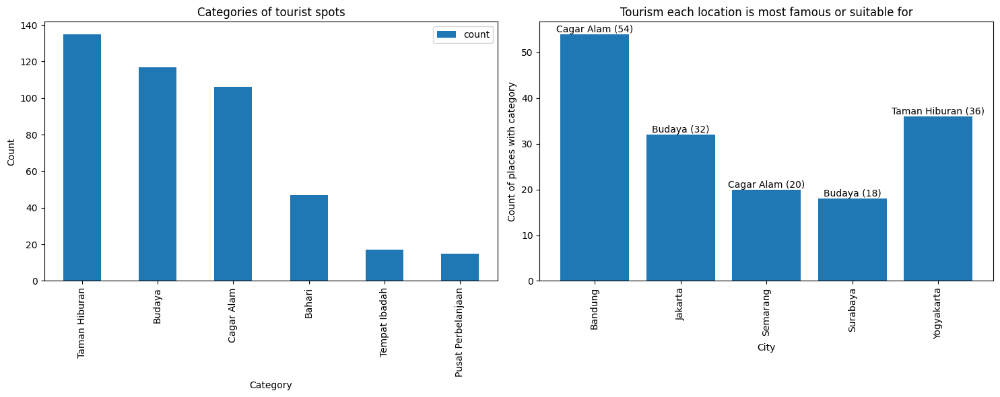

========== City With Highest Nature Reserve ====================


,count
City,
Bandung,54


In [205]:
unique_categories = tourism_df['Category'].value_counts().reset_index()
city_category = tourism_df.groupby(['City','Category']).size().reset_index(name='Count')
top_categories_by_city = city_category.groupby('City',group_keys=False).apply(lambda x:x.loc[x['Count'].idxmax()]).reset_index(drop=True).sort_values(by='City')

fig,axs = plt.subplots(nrows=1,ncols=2,figsize=(15,6))
axs = axs.flatten()

unique_categories.plot(kind='bar',x='Category',ax=axs[0],y='count')
axs[0].set_title('Categories of tourist spots')
axs[0].set_xlabel('Category')
axs[0].set_ylabel('Count')

axs[1].bar(top_categories_by_city['City'],top_categories_by_city['Count'])
axs[1].set_title('Tourism each location is most famous or suitable for')
axs[1].set_xlabel('City')
axs[1].set_ylabel('Count of places with category')
for i,(count,category) in enumerate(zip(top_categories_by_city['Count'],top_categories_by_city['Category'])):
  axs[1].text(i,count,f'{category} ({count})',ha='center',va='bottom')
axs[1].tick_params(axis='x',rotation=90)

plt.tight_layout()
plt.show()


nature_spot_df = tourism_df[tourism_df['Category'] == 'Cagar Alam']
print("="*64)
print("="*10,"City With Highest Nature Reserve","="*20)
nature_spot_df['City'].value_counts().sort_values(ascending=False).head(1)

4. **To better understand tourism, you need to create a combined data with places and their user
ratings.**
  1.   Use this data to figure out the spots that are most loved by the tourists. Also, which city
  2.   Indonesia provides a wide range of tourist spots ranging from historical and cultural beauties to advanced amusement parks. Among these, which category of places are users liking the most?



In [206]:
#Merging the final dataset
final_df = rating_df.merge(user_df,on='User_Id',suffixes=('_rating','_user'))
final_df = final_df.merge(tourism_df,on='Place_Id',suffixes=('_rating_user','_tourism'))
final_df.rename(columns={'Rating': 'AggDest_Rating'}, inplace=True)
final_df.head(2)

,User_Id,Place_Id,Place_Ratings,Location,Age,Place_Name,Description,Category,City,Price,AggDest_Rating,Time_Minutes,Coordinate,Lat,Long,Price_Log,Rating_Label,Time_Minutes_Clipped,Time_Minutes_log
0,1,179,3,"Semarang, Jawa Tengah",20,Candi Ratu Boko,Situs Ratu Baka atau Candi Boko (Hanacaraka:Í¶...,Budaya,Yogyakarta,75000,4.6,90.000000,"{'lat': -7.7705416, 'lng': 110.4894158}",-7.770542,110.489416,11.225257,High,90.000000,4.510860
1,1,344,2,"Semarang, Jawa Tengah",20,Pantai Marina,Pantai Marina (bahasa Jawa: Í¶•Í¶±Í¶∂Í¶±Í¶∂Í¶Ç...,Bahari,Semarang,3000,4.1,28.606874,"{'lat': -6.948877, 'lng': 110.3893285}",-6.948877,110.389329,8.006701,Low,28.606874,3.388007


In [207]:
places_filtered_by_rating = final_df.groupby(['Place_Name','City'])['AggDest_Rating'].mean().sort_values(ascending=False)
print("Most loved spots ==========")
places_filtered_by_rating[places_filtered_by_rating >= 5]

Most loved spots ==========


,,AggDest_Rating
Place_Name,City,
Wisata Kuliner Pecenongan,Jakarta,5.0
Desa Wisata Sungai Code Jogja Kota,Yogyakarta,5.0
Freedom Library,Jakarta,5.0
Kauman Pakualaman Yogyakarta,Yogyakarta,5.0


In [208]:
category_filtered_by_rating = final_df.groupby(['Category'])['AggDest_Rating'].mean().sort_values(ascending=False)
print('Most like category=========')
category_filtered_by_rating[category_filtered_by_rating >= 4.5]

Most like category=========


,AggDest_Rating
Category,
Tempat Ibadah,4.715707
Budaya,4.523302


**5. Build a recommender model for the system**
1.   I. Use the above data to develop a collaborative filtering model for recommendation and use that to recommend other places to visit using the current tourist location (placename)

**FINAL EDA FOR MODEL**



In [209]:
final_df.describe()

,User_Id,Place_Id,Place_Ratings,Age,Price,AggDest_Rating,Time_Minutes,Lat,Long,Price_Log,Time_Minutes_Clipped,Time_Minutes_log
count,9921.000000,9921.000000,9921.000000,9921.000000,9921.000000,9921.000000,9921.000000,9921.000000,9921.000000,9921.000000,9921.000000,9921.000000
mean,151.337970,219.486745,3.066929,28.728455,23774.317105,4.445711,52.657346,-7.098587,109.159964,6.495417,47.761930,3.704132
std,86.107089,126.164097,1.380070,6.353264,62834.992319,0.207520,45.451856,0.708269,1.956801,4.562366,31.869197,0.580611
min,1.000000,1.000000,1.000000,18.000000,0.000000,3.400000,10.000000,-8.197894,103.931398,0.000000,10.000000,2.397895
25%,77.000000,109.000000,2.000000,24.000000,0.000000,4.400000,25.296457,-7.747846,107.578369,0.000000,25.296457,3.269434
50%,151.000000,220.000000,3.000000,29.000000,5000.000000,4.500000,29.803946,-7.020524,110.237468,8.517393,29.803946,3.427643
75%,226.000000,329.000000,4.000000,34.000000,20000.000000,4.600000,60.000000,-6.829411,110.431869,9.903538,60.000000,4.110874
max,300.000000,437.000000,5.000000,40.000000,900000.000000,5.000000,360.000000,1.078880,112.821662,13.710151,112.055315,4.727877


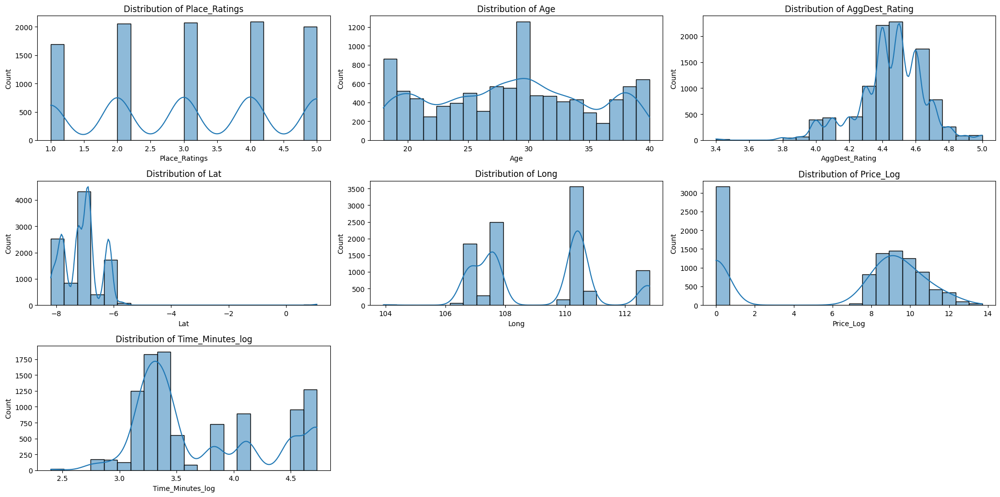

In [210]:
numeric_columns = final_df.drop(columns=['User_Id','Place_Id','Price','Time_Minutes','Time_Minutes_Clipped']).select_dtypes(include=[np.number]).columns.tolist()

fig,axs = plt.subplots(nrows=3,ncols=3,figsize=(20,10))
axs = axs.flatten()
for i,column in enumerate(numeric_columns):
  sns.histplot(data=final_df,x=column,kde=True,ax=axs[i],bins=20)
  axs[i].set_title(f'Distribution of {column}')

for j in range(len(numeric_columns), len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()


In [211]:
final_df.drop(columns=['User_Id','Place_Id','Price','AggDest_Rating','Time_Minutes','Time_Minutes_Clipped']).select_dtypes(include=[np.number]).skew().to_frame().T

,Place_Ratings,Age,Lat,Long,Price_Log,Time_Minutes_log
0,-0.047893,0.007343,2.946835,0.246702,-0.607044,0.64205


In [212]:
def tuckey_outlier(df,column):
  data = df[column]
  Q1= data.quantile(0.25)
  Q3= data.quantile(0.75)

  IQR = Q3 - Q1
  lower_bound = Q1 - (IQR * 1.5)
  upper_bound = Q3 + (IQR * 1.5)
  outliers = data[(data < lower_bound) | (data > upper_bound)]
  return {'column':column,'outliers_index':outliers.index,'total_outliers':len(outliers)}


numeric_columns = final_df.drop(columns=['User_Id','Place_Id','Price','AggDest_Rating']).select_dtypes(include=[np.number]).columns.to_list()
outliers_found = []
for column in numeric_columns:
  outliers_found.append(tuckey_outlier(final_df,column))

pd.DataFrame(outliers_found,columns=['column','outliers_index','total_outliers']).T

,0,1,2,3,4,5,6,7
column,Place_Ratings,Age,Time_Minutes,Lat,Long,Price_Log,Time_Minutes_Clipped,Time_Minutes_log
outliers_index,"Index([], dtype='int64')","Index([], dtype='int64')","Index([ 11, 14, 22, 24, 33, 45, 4...","Index([ 123, 431, 567, 592, 1948, 2065, 345...","Index([], dtype='int64')","Index([], dtype='int64')","Index([], dtype='int64')","Index([], dtype='int64')"
total_outliers,0,0,1276,19,0,0,0,0


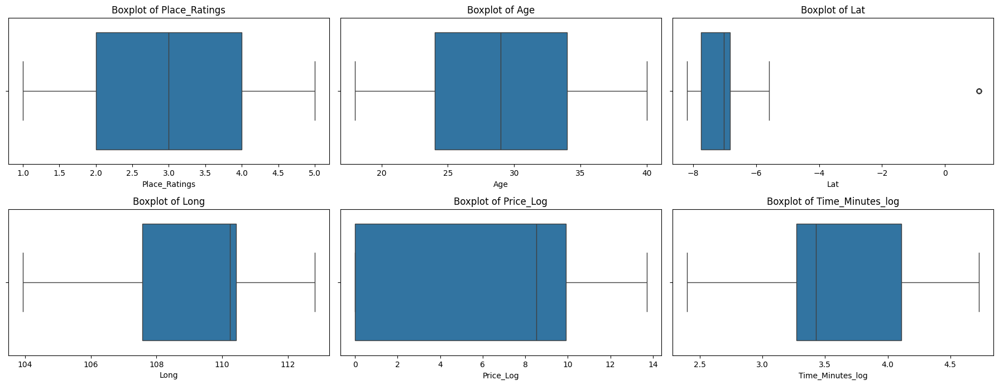

In [213]:
#Checking for outliers in our final dataset
numeric_columns = final_df.drop(columns=['User_Id','Place_Id','Price','AggDest_Rating','Time_Minutes','Time_Minutes_Clipped']).select_dtypes(include=[np.number]).columns.tolist()
fig,axs = plt.subplots(nrows=3,ncols=3,figsize=(18,10))
axs = axs.flatten()
for i,column in enumerate(numeric_columns):
  sns.boxplot(x=final_df[column],ax=axs[i])
  axs[i].set_title(f'Boxplot of {column}')

for j in range(len(numeric_columns), len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

**We have lat,long of the place and Name of city of the customer. Using Customer city we can get the lat,long of the center of city and calculate a approx or rough distance of customer from tourist place. this can be useful for customer profile**

In [214]:
from math import radians, sin, cos, sqrt, atan2

def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat/2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return round((R * c),2)

In [215]:
print(user_df['Location'].unique())
location_coords = {
    'Semarang, Jawa Tengah': (-6.9667, 110.4167),
    'Bekasi, Jawa Barat': (-6.2383, 106.9756),
    'Cirebon, Jawa Barat': (-6.7070, 108.5523),
    'Lampung, Sumatera Selatan': (-5.4500, 105.2667),
    'Jakarta Utara, DKI Jakarta': (-6.1214, 106.7741),
    'Jakarta Selatan, DKI Jakarta': (-6.2667, 106.8000),
    'Bandung, Jawa Barat': (-6.9175, 107.6191),
    'Surabaya, Jawa Timur': (-7.2575, 112.7521),
    'Yogyakarta, DIY': (-7.8014, 110.3644),
    'Bogor, Jawa Barat': (-6.5950, 106.8167),
    'Depok, Jawa Barat': (-6.4025, 106.7942),
    'Jakarta Pusat, DKI Jakarta': (-6.1865, 106.8346),
    'Jakarta Timur, DKI Jakarta': (-6.2250, 106.9000),
    'Subang, Jawa Barat': (-6.5654, 107.7580),
    'Jakarta Barat, DKI Jakarta': (-6.1783, 106.7824),
    'Palembang, Sumatera Selatan': (-2.9761, 104.7754),
    'Sragen, Jawa Tengah': (-7.4295, 111.0039),
    'Ponorogo, Jawa Timur': (-7.8654, 111.4693),
    'Klaten, Jawa Tengah': (-7.7050, 110.6066),
    'Solo, Jawa Tengah': (-7.5667, 110.8167),
    'Tanggerang, Banten': (-6.1783, 106.6319),
    'Serang, Banten': (-6.1149, 106.1503),
    'Cilacap, Jawa Tengah': (-7.7167, 109.0000),
    'Kota Gede, DIY': (-7.8131, 110.4032),
    'Karawang, Jawa Barat': (-6.3059, 107.2965),
    'Purwakarat, Jawa Barat': (-6.5647, 107.4481),  # Assuming it's Purwakarta
    'Nganjuk, Jawa Timur': (-7.6052, 111.9035),
    'Madura, Jawa Timur': (-7.0083, 113.8500)
}
final_df['User_Lat'] = final_df['Location'].map(lambda x: location_coords[x][0])
final_df['User_Long'] = final_df['Location'].map(lambda x: location_coords[x][1])
final_df['User_Distance_km'] = final_df.apply(
    lambda row: haversine_distance(row['User_Lat'], row['User_Long'], row['Lat'], row['Long']),
    axis=1
)

print(final_df['User_Distance_km'].head(5))

['Semarang, Jawa Tengah' 'Bekasi, Jawa Barat' 'Cirebon, Jawa Barat'
 'Lampung, Sumatera Selatan' 'Jakarta Utara, DKI Jakarta'
 'Jakarta Selatan, DKI Jakarta' 'Bandung, Jawa Barat'
 'Surabaya, Jawa Timur' 'Yogyakarta, DIY' 'Bogor, Jawa Barat'
 'Depok, Jawa Barat' 'Jakarta Pusat, DKI Jakarta'
 'Jakarta Timur, DKI Jakarta' 'Subang, Jawa Barat'
 'Jakarta Barat, DKI Jakarta' 'Palembang, Sumatera Selatan'
 'Sragen, Jawa Tengah' 'Ponorogo, Jawa Timur' 'Klaten, Jawa Tengah'
 'Solo, Jawa Tengah' 'Tanggerang, Banten' 'Serang, Banten'
 'Cilacap, Jawa Tengah' 'Kota Gede, DIY' 'Karawang, Jawa Barat'
 'Purwakarat, Jawa Barat' 'Nganjuk, Jawa Timur' 'Madura, Jawa Timur']
0     89.74
1      3.61
2    406.16
3     33.15
4     91.99
Name: User_Distance_km, dtype: float64


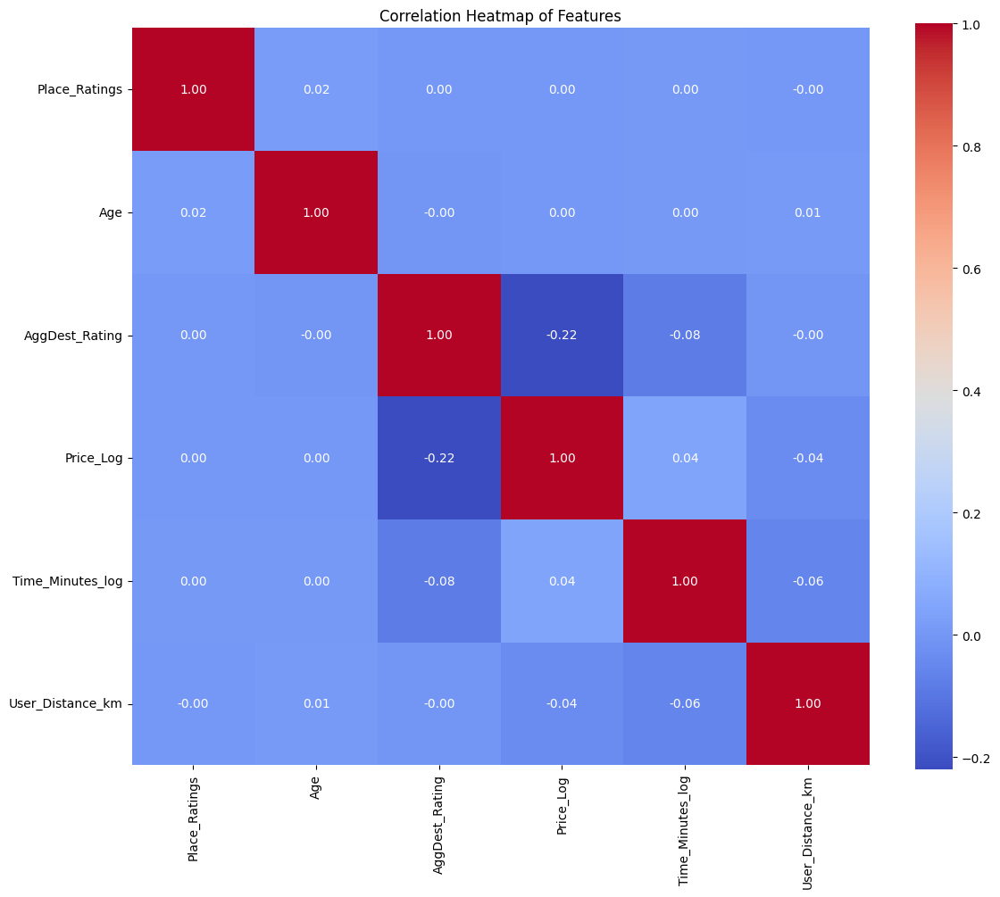

In [216]:
#Heatmap of the features we will use in reccomendation system
numeric_cols = final_df.drop(columns=['User_Id','Place_Id','Time_Minutes','Time_Minutes_Clipped','Price','User_Lat','User_Long','Lat','Long']).select_dtypes(include=['float64', 'int64']).copy()
corr_matrix = numeric_cols.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True)
plt.title('Correlation Heatmap of Features')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

**Heatmap Conclusion**: Most of the features does not have any significant correlation to each others

**Recommendation basis User Profile**
---
We are using Nearest Neighbors to recommend places to any new user basis age,distance similarity

In [235]:
#KNN Neighbors Model
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import LabelEncoder,StandardScaler

df = final_df.copy()
label_encoder = LabelEncoder()
df['Rating_Label_Encoded'] = label_encoder.fit_transform(df['Rating_Label'])

#Creating user profile interation which is based on Age, Distance this will be used as an input to our recommendation system.
#This kind of profile will help us to recommend for a new user who has not rated any place aswell.
user_profiles = df.groupby('User_Id').agg({
    'Age': 'first',
    'User_Distance_km': 'mean'
}).reset_index()

user_profiles.set_index('User_Id', inplace=True)

# Scaling user profile
stdscaler = StandardScaler()
user_profiles_scaled = stdscaler.fit_transform(user_profiles)

knn = NearestNeighbors(n_neighbors=5, metric='euclidean')
knn.fit(user_profiles_scaled)

def recommend_places_for_new_user(new_user_dict, df, top_n=10):
    new_user_vector = pd.DataFrame([new_user_dict], columns=user_profiles.columns)
    new_user_scaled = stdscaler.transform(new_user_vector)
    distances, indices = knn.kneighbors(new_user_scaled)
    similar_user_ids = user_profiles.iloc[indices[0]].index.tolist()

    similar_users_df = df[df['User_Id'].isin(similar_user_ids)]

    #Get places similar based on the Place_Id which are founded in similar user profile datafram
    place_scores = similar_users_df.groupby('Place_Id').agg({
        'Place_Ratings': 'mean',
        'Rating_Label_Encoded': 'mean',
        'Time_Minutes_log': 'first',
        'Place_Name': 'first',
        'Category': 'first',
        'City': 'first'
    }).reset_index()


    #Normalizing
    place_scores['Rating_Label_Norm'] = (
        (place_scores['Rating_Label_Encoded'] - place_scores['Rating_Label_Encoded'].min()) /
        (place_scores['Rating_Label_Encoded'].max() - place_scores['Rating_Label_Encoded'].min())
    )
    place_scores['Time_Minutes_Norm'] = (
        (place_scores['Time_Minutes_log'] - place_scores['Time_Minutes_log'].min()) /
        (place_scores['Time_Minutes_log'].max() - place_scores['Time_Minutes_log'].min())
    )
    place_scores['Place_Ratings_Norm'] = (
        (place_scores['Place_Ratings'] - place_scores['Place_Ratings'].min()) /
        (place_scores['Place_Ratings'].max() - place_scores['Place_Ratings'].min())
    )

    #Scoring for final recommendation
    place_scores['Score'] = (
        0.5 * place_scores['Place_Ratings_Norm'] +
        0.4 * place_scores['Rating_Label_Norm'] +
        0.2 * (1 - place_scores['Time_Minutes_Norm'])
    )

    recommendations = place_scores.sort_values(by='Score', ascending=False).head(top_n)
    return recommendations[['Place_Id', 'Place_Name', 'City', 'Category','Time_Minutes_log', 'Score']]

In [239]:
#function to calculate Precision@K
def precision_at_k(recommendations_df, similar_users_df, k=10, threshold=4.0):
    top_k_places = recommendations_df.head(k)['Place_Id'].tolist()
    user_place_ratings = similar_users_df.groupby('Place_Id')['Place_Ratings'].mean().reset_index()
    user_place_ratings['Relevant'] = user_place_ratings['Place_Ratings'] >= threshold
    matched = user_place_ratings[user_place_ratings['Place_Id'].isin(top_k_places)]
    precision = matched['Relevant'].sum() / k
    return precision


#Testing the Recommendation System and Create a New User Input
new_user_input = {
    'Age': 25,
    'User_Distance_km': 400
}

recommendations = recommend_places_for_new_user(new_user_input, df, top_n=10)
print(f" Percision@K {round((precision_at_k(recommendations,similar_users_df) * 100),2)}%")
print("Recommended Places:\n")
recommendations

 Percision@K 60.0%
Recommended Places:



,Place_Id,Place_Name,City,Category,Time_Minutes_log,Score
97,348,Pura Giri Natha,Semarang,Budaya,3.254106,1.050747
95,339,Sam Poo Kong Temple,Semarang,Budaya,3.220122,0.920890
70,264,Gereja Katedral Santo Petrus Bandung,Bandung,Tempat Ibadah,3.329009,0.918086
105,386,Air Terjun Semirang,Semarang,Cagar Alam,3.258661,0.916948
115,416,Keraton Surabaya,Surabaya,Budaya,3.261757,0.916631
98,353,Taman Srigunting,Semarang,Taman Hiburan,3.396910,0.911140
81,300,Sanghyang Heuleut,Bandung,Cagar Alam,3.343564,0.908264
22,89,De Mata Museum Jogja,Yogyakarta,Budaya,3.346677,0.907945
35,146,Bukit Wisata Pulepayung,Yogyakarta,Cagar Alam,3.372477,0.905306
43,160,Pasar Kebon Empring Bintaran,Yogyakarta,Pusat Perbelanjaan,3.426027,0.899829


In [240]:
import matplotlib.pyplot as plt
import pandas as pd

#Function to plot Neighbors of the New User Input
def plot_knn_neighbors(new_user_dict, user_profiles_df, knn_model, scaler=None):

    new_user_vector = pd.DataFrame([new_user_dict], columns=user_profiles_df.columns)

    if scaler:
        user_profiles_scaled = pd.DataFrame(scaler.transform(user_profiles_df), columns=user_profiles_df.columns, index=user_profiles_df.index)
        new_user_scaled = pd.DataFrame(scaler.transform(new_user_vector), columns=user_profiles_df.columns)
        distances, indices = knn_model.kneighbors(new_user_scaled)
        neighbors_unscaled = user_profiles_df.iloc[indices[0]]
    else:
        user_profiles_scaled = user_profiles_df.copy()
        new_user_scaled = new_user_vector.copy()
        distances, indices = knn_model.kneighbors(new_user_scaled)
        neighbors_unscaled = user_profiles_df.iloc[indices[0]]

    plt.figure(figsize=(10, 6))
    plt.scatter(user_profiles_df['Age'], user_profiles_df['User_Distance_km'], c='lightgray', label='All Users')

    plt.scatter(neighbors_unscaled['Age'], neighbors_unscaled['User_Distance_km'], c='blue', label='Nearest Neighbors', s=80)
    plt.scatter(new_user_vector['Age'], new_user_vector['User_Distance_km'], c='red', label='New User', marker='X', s=120)

    plt.xlabel("Age")
    plt.ylabel("User Distance (km)")
    plt.title("KNN Nearest Neighbors Visualization (Plotted on Original Scale)")
    plt.legend()
    plt.grid(True)
    plt.show()


K Nearest Neighbors Plot==== 



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but NearestNeighbors was fitted without feature names
  warnings.warn(


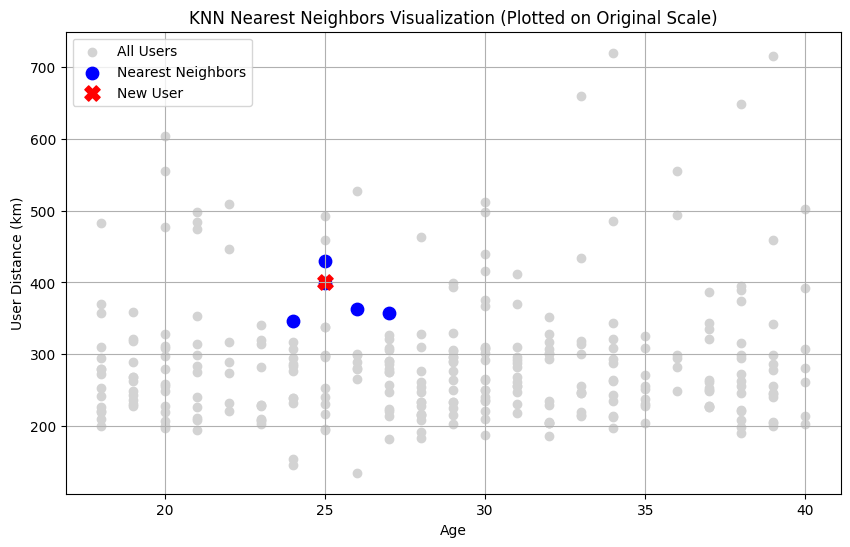

In [241]:
print("K Nearest Neighbors Plot====","\n")
plot_knn_neighbors(new_user_input, user_profiles, knn, scaler=stdscaler)